In [ ]:
import numpy as np
import pandas as pd
import statsmodels
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import coint, adfuller
import matplotlib.dates as mdates

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df= pd.read_csv('/content/drive/MyDrive/Assets/sp500_stocks.csv')
df.head()

,Date,Symbol,Adj Close,Close,High,Low,Open,Volume
0,2010-01-04,MMM,44.254017,69.414719,69.774246,69.122070,69.473244,3640265.0
1,2010-01-05,MMM,43.976837,68.979935,69.590302,68.311035,69.230766,3405012.0
2,2010-01-06,MMM,44.600502,69.958191,70.735786,69.824417,70.133781,6301126.0
3,2010-01-07,MMM,44.632484,70.008362,70.033447,68.662209,69.665550,5346240.0
4,2010-01-08,MMM,44.946964,70.501671,70.501671,69.648827,69.974915,4073337.0


In [ ]:
df.sample(20)

,Date,Symbol,Adj Close,Close,High,Low,Open,Volume
497850,2013-02-08,CCI,47.411839,70.790001,71.040001,70.129997,70.320000,2500200.0
256639,2020-04-06,BA,148.770004,148.770004,149.690002,129.210007,133.699997,51085500.0
599699,2022-10-11,ETN,132.044128,136.419998,138.160004,134.270004,135.059998,1566200.0
701186,2016-05-20,FDS,142.762863,155.380005,155.610001,152.679993,153.429993,271300.0
792710,2014-04-21,GD,91.309624,109.300003,109.599998,108.419998,109.190002,1280000.0
1216028,2013-11-06,MS,22.147484,29.129999,29.219999,28.940001,29.139999,8972300.0
1401294,2018-06-26,PFG,42.767784,54.169998,55.000000,53.980000,54.970001,1139200.0
185933,2017-04-17,ADP,87.376328,101.860001,102.000000,101.360001,101.949997,1215400.0
1701220,2010-07-20,UAL,22.200001,22.200001,22.500000,21.160000,21.160000,9829300.0
587775,2019-04-17,DUK,71.050537,89.059998,89.720001,88.709999,89.129997,4518200.0


In [ ]:
df.sort_values(by='Date', inplace=True)
df.head()

,index,Symbol,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,,,
2010-01-04,0,MMM,44.254017,69.414719,69.774246,69.12207,69.473244,3640265.0
2010-01-04,1137738,MKC,13.688910,18.15,18.205,18.030001,18.205,980000.0
2010-01-04,1100918,MTB,44.289589,67.010002,67.650002,66.32,67.629997,721000.0
2010-01-04,751128,FOXA,96.186588,mean,mean,mean,mean,mean
2010-01-04,603848,ECL,38.280537,45.25,45.34,44.860001,45.029999,1009500.0


In [ ]:
df.tail()

,index,Symbol,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,,,
2024-08-20,1432297,PHM,124.739998,124.739998,127.110397,124.309998,125.550003,1389230.0
2024-08-20,419747,CFG,41.209999,41.209999,41.490002,41.115002,41.369999,3481347.0
2024-08-20,1428615,PSA,325.549988,325.549988,325.790009,323.0,323.5,544462.0
2024-08-20,1443343,QCOM,172.110001,172.110001,175.429993,171.179993,173.940002,6176182.0
2024-08-20,1852045,ZTS,183.600006,183.600006,184.759995,182.900101,184.479996,1186374.0


In [ ]:
print("\nBasic Info:")
df.info()


Basic Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1852046 entries, 0 to 1852045
Data columns (total 8 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date       object 
 1   Symbol     object 
 2   Adj Close  float64
 3   Close      float64
 4   High       float64
 5   Low        float64
 6   Open       float64
 7   Volume     float64
dtypes: float64(6), object(2)
memory usage: 113.0+ MB


In [ ]:
print(df['Symbol'].value_counts())

Symbol
MMM     3682
MOS     3682
NSC     3682
NDSN    3682
NI      3682
        ... 
EBAY    3682
ETN     3682
EMN     3682
DD      3682
ZTS     3682
Name: count, Length: 503, dtype: int64


In [ ]:
print("\nSummary statistics:")
print(df.describe())


Summary statistics:
          Adj Close         Close          High           Low          Open  \
count  1.757167e+06  1.757167e+06  1.757167e+06  1.757167e+06  1.757167e+06   
mean   9.618659e+01  1.037039e+02  1.048399e+02  1.025118e+02  1.036839e+02   
std    2.054719e+02  2.056383e+02  2.080360e+02  2.031662e+02  2.055534e+02   
min    2.036244e-01  2.220000e-01  2.262500e-01  2.162500e-01  2.180000e-01   
25%    2.890313e+01  3.485000e+01  3.523000e+01  3.445000e+01  3.485000e+01   
50%    5.341603e+01  6.228000e+01  6.291000e+01  6.160000e+01  6.226000e+01   
75%    1.024300e+02  1.126400e+02  1.138000e+02  1.114100e+02  1.126200e+02   
max    8.854820e+03  8.854820e+03  8.944000e+03  8.766080e+03  8.874990e+03   

             Volume  
count  1.757167e+06  
mean   6.966618e+06  
std    3.318610e+07  
min    0.000000e+00  
25%    9.990000e+05  
50%    2.179856e+06  
75%    5.000000e+06  
max    3.692928e+09  


In [ ]:
print("\nChecking for duplicates:")
print(df.duplicated().sum())


Checking for duplicates:
0


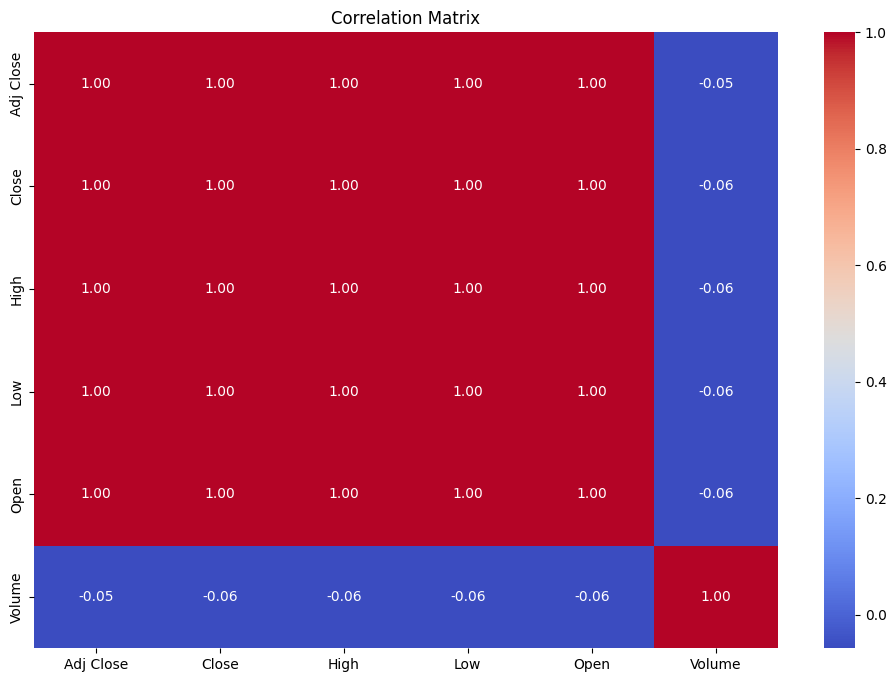

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

# Extract numerical features for correlation analysis
numerical_df = df.select_dtypes(include=['number'])

plt.figure(figsize=(12,8))
sns.heatmap(numerical_df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
tickers=list(df['Symbol'].unique())
len(tickers)

503

In [ ]:
import yfinance as yf

def get_company_metadata(tickers):
    data = []
    for ticker in tickers:
        try:
            stock = yf.Ticker(ticker)
            info = stock.info
            data.append({
                'Ticker': ticker,
                'Company Name': info.get('longName', 'N/A'),
                'Sector': info.get('sector', 'N/A'),
                'Industry': info.get('industry', 'N/A'),
                'Market Cap': info.get('marketCap', 'N/A')
            })
        except Exception as e:
            print(f"Error retrieving data for {ticker}: {e}")

    return pd.DataFrame(data)

metadata_df = get_company_metadata(tickers)

metadata_df


,Ticker,Company Name,Sector,Industry,Market Cap
0,MMM,3M Company,Industrials,Conglomerates,75151630336
1,AOS,A. O. Smith Corporation,Industrials,Specialty Industrial Machinery,12841652224
2,ABT,Abbott Laboratories,Healthcare,Medical Devices,197139365888
3,ABBV,AbbVie Inc.,Healthcare,Drug Manufacturers - General,346988675072
4,ACN,Accenture plc,Technology,Information Technology Services,222270685184
...,...,...,...,...,...
498,XYL,Xylem Inc.,Industrials,Specialty Industrial Machinery,32665464832
499,YUM,"Yum! Brands, Inc.",Consumer Cyclical,Restaurants,39191588864
500,ZBRA,Zebra Technologies Corporation,Technology,Communication Equipment,18876362752
501,ZBH,"Zimmer Biomet Holdings, Inc.",Healthcare,Medical Devices,21645154304


In [ ]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503 entries, 0 to 502
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Ticker        503 non-null    object
 1   Company Name  503 non-null    object
 2   Sector        503 non-null    object
 3   Industry      503 non-null    object
 4   Market Cap    503 non-null    int64 
dtypes: int64(1), object(4)
memory usage: 19.8+ KB


In [ ]:
metadata_df['Market Cap'] = pd.to_numeric(metadata_df['Market Cap'], errors='coerce')

In [ ]:
import plotly.express as px
fig = px.treemap(metadata_df,
                 path=['Sector', 'Industry', 'Company Name'],
                 values='Market Cap',
                 title='Market Capitalization Treemap by Sector and Industry',
                 hover_data=['Industry','Market Cap','Sector' ],
                 color='Market Cap',
                 color_continuous_scale='Viridis')

fig.show()

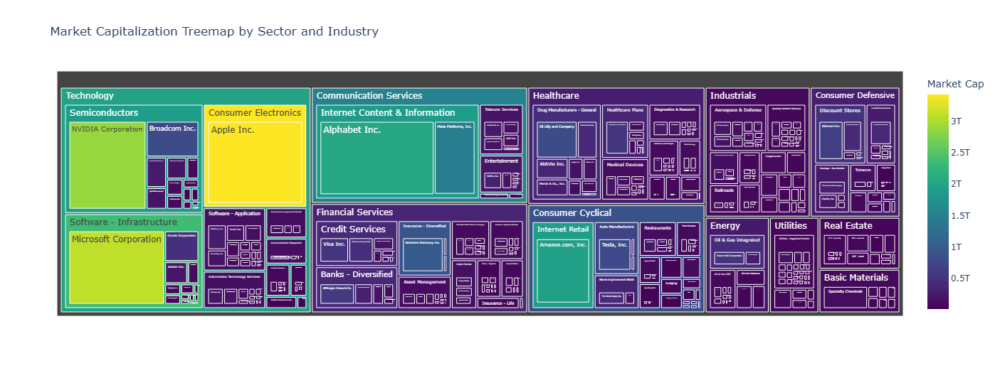

In [ ]:
fig = px.sunburst(metadata_df,
                  path=['Sector', 'Industry', 'Company Name'],
                  values='Market Cap',
                  title='Sunburst Chart: Market Cap by Sector and Industry',
                  hover_data=['Industry','Market Cap','Sector' ],
                  color='Market Cap',
                  color_continuous_scale='Viridis')

fig.update_layout(
    width=1000,  # Increase width of the figure
    height=800,  # Increase height of the figure
    title_x=0.5  # Center the title
)

fig.show()

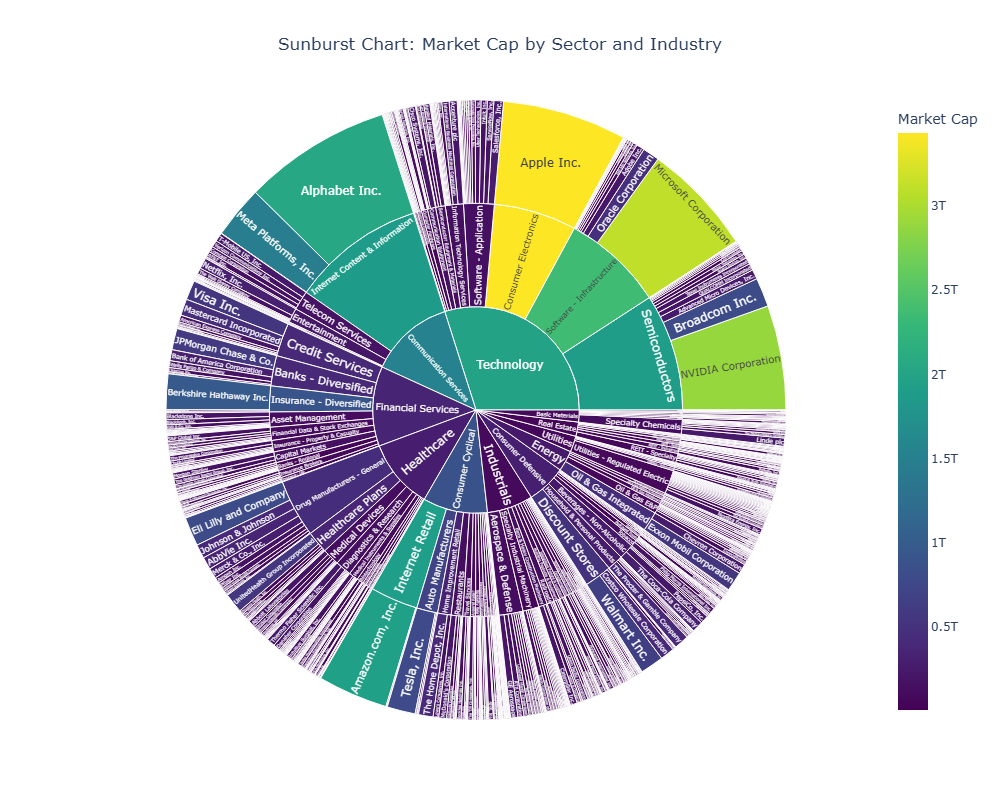

In [ ]:
df.reset_index(inplace=True)
df.set_index('Date', inplace=True)

In [ ]:
df_close = df[['Symbol', 'Adj Close']].copy()

In [ ]:
df_pivot= df_close.reset_index().pivot(index='Date', columns='Symbol', values='Adj Close')
print(df_pivot.head())

Symbol              A       AAL      AAPL  ABBV  ABNB        ABT      ACGL  \
Date                                                                         
2010-01-04  20.084951  4.496878  6.454506   NaN   NaN  18.852142  7.994444   
2010-01-05  19.866777  5.005958  6.465664   NaN   NaN  18.699833  7.967778   
2010-01-06  19.796186  4.798554  6.362821   NaN   NaN  18.803680  7.933333   
2010-01-07  19.770527  4.939964  6.351058   NaN   NaN  18.959455  7.886667   
2010-01-08  19.764101  4.845692  6.393282   NaN   NaN  19.056383  7.871111   

Symbol            ACN       ADBE        ADI  ...        WTW         WY  \
Date                                         ...                         
2010-01-04  32.071796  37.090000  23.694084  ...  52.707329   9.838811   
2010-01-05  32.270012  37.700001  23.656675  ...  52.589157  10.047674   
2010-01-06  32.613075  37.619999  23.611784  ...  53.435802   9.936578   
2010-01-07  32.582581  36.889999  23.424749  ...  53.278309   9.892134   
2010-01-0

In [ ]:
# Calculate daily returns
returns = df_pivot.pct_change().dropna()
returns.head()

Symbol,A,AAL,AAPL,ABBV,ABNB,ABT,ACGL,ACN,ADBE,ADI,...,WTW,WY,WYNN,XEL,XOM,XYL,YUM,ZBH,ZBRA,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2024-07-09,-0.005156,0.004574,0.003775,0.009188,0.003224,-0.004700,-0.002646,-0.004708,-0.016302,-0.005700,...,-0.009240,-0.000725,-0.005748,0.006908,-0.011054,-0.003506,-0.010005,-0.005922,0.002417,-0.006783
2024-07-10,0.013156,0.015483,0.018804,0.000536,-0.004001,0.013873,-0.005102,-0.008790,-0.002597,0.027240,...,0.003186,0.000363,-0.010028,0.002287,0.008834,0.020585,0.019817,0.010779,0.027186,-0.004304
2024-07-11,0.029511,-0.037668,-0.023221,0.010527,-0.038462,0.010965,-0.005128,0.013055,-0.012258,-0.019259,...,0.014797,0.050036,0.008342,0.028332,0.011883,0.011222,0.002710,0.012067,0.013928,0.024497
2024-07-12,0.010778,-0.004660,0.013051,0.002178,0.005342,0.000384,-0.005155,0.042418,0.002546,0.020621,...,0.008512,0.011050,0.014419,0.003698,0.000177,0.003989,0.013820,0.004621,-0.009533,0.007314
2024-07-15,-0.009226,-0.004682,0.016743,-0.004149,0.002998,-0.006849,0.006839,0.023307,0.011913,-0.003521,...,-0.003331,-0.008197,-0.014331,-0.019344,0.017127,-0.008091,-0.026045,-0.019873,0.007104,-0.005920


In [ ]:
adf_results = {ticker: adfuller(returns[ticker])[1] for ticker in returns.columns} # Changed tickers to ticker
stationary_tickers = [ticker for ticker, p_value in adf_results.items() if p_value < 0.05] # Changed tickers to ticker

In [ ]:
print(pd.DataFrame.from_dict(adf_results, orient='index', columns=['p-value']))

           p-value
A     1.017270e-08
AAL   4.117983e-01
AAPL  2.902080e-05
ABBV  5.052579e-10
ABNB  2.105509e-10
...            ...
XYL   6.136483e-07
YUM   1.828509e-10
ZBH   1.351145e-02
ZBRA  5.519866e-02
ZTS   7.097136e-13

[503 rows x 1 columns]


In [ ]:
# Filter only stationary tickers
stationary_data = returns[stationary_tickers]

<Figure size 1200x600 with 0 Axes>

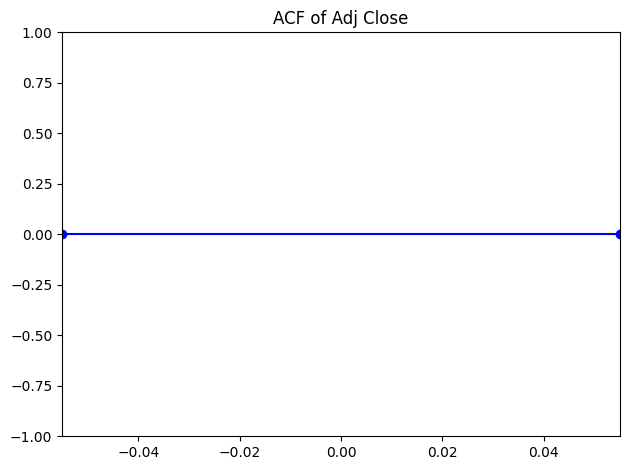

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

tickers = ['COF', 'VST', 'DFS', 'WELL', 'ETSY', 'GPC', 'ALB', 'POOL', 'HUBB', 'HUM']

# Use .isin() to filter the DataFrame
data = df[df['Symbol'].isin(tickers)]['Adj Close']

# Plot ACF for both time series
plt.figure(figsize=(12, 6))
plot_acf(data,
         lags=40,
         title=f'ACF of Adj Close',
         zero=False, alpha=0.05,
         marker='o',
         linestyle='-',
         color='blue',
         use_vlines=True,
         adjusted=False,
         fft=False,
         missing='none'
         ) # Added lags, alpha, marker, linestyle and color

plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

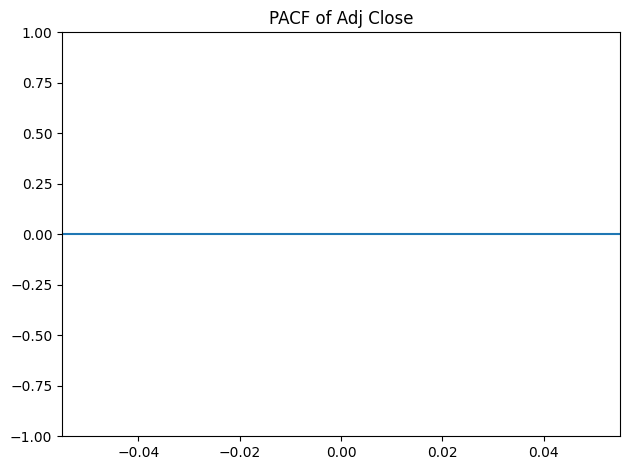

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
# Plot PACF
plt.figure(figsize=(12, 6))
plot_pacf(
    data,
    lags=40,
    title=f'PACF of Adj Close',
    zero=False,
    alpha=0.05,
    method='ywm',
    ) # Added lags, alpha, and method

plt.tight_layout()
plt.show()

In [ ]:
import tqdm
def find_cointegrated_pairs(data):
    n = data.shape[1]
    pairs = []

    for i in tqdm.tqdm(range(n)):
        for j in range(i + 1, n):
            result = coint(data.iloc[:, i], data.iloc[:, j])
            if result[1] < 0.05:  # p-value threshold for cointegration
                pairs.append((data.columns[i], data.columns[j], result[1]))

    return pairs

In [ ]:
cointegrated_pairs = find_cointegrated_pairs(stationary_data)

print(f'Best cointegrated pairs: {cointegrated_pairs}')

100%|██████████| 473/473 [12:56<00:00,  1.64s/it]


Best cointegrated pairs: [('A', 'AAPL', 3.262182571288862e-09), ('A', 'ABBV', 4.688686382693653e-10), ('A', 'ABNB', 6.816541709169907e-06), ('A', 'ABT', 3.930526558137893e-08), ('A', 'ACGL', 7.820446430167802e-08), ('A', 'ACN', 1.298054100565175e-07), ('A', 'ADBE', 1.7600669524159863e-08), ('A', 'ADI', 8.603058221397064e-07), ('A', 'ADM', 6.196642570490378e-08), ('A', 'ADP', 4.802101449754031e-11), ('A', 'ADSK', 1.5595678519867298e-09), ('A', 'AEE', 2.3388609825501787e-07), ('A', 'AEP', 1.9897348496991484e-09), ('A', 'AES', 6.935129527033342e-06), ('A', 'AFL', 2.4272423914467766e-09), ('A', 'AIG', 5.172857292368892e-10), ('A', 'AIZ', 2.8147599054536467e-08), ('A', 'AJG', 1.416061359840643e-09), ('A', 'AKAM', 5.858107891856397e-09), ('A', 'ALB', 2.1667914244865623e-10), ('A', 'ALGN', 8.356933387802925e-07), ('A', 'ALL', 4.211927607573677e-08), ('A', 'AMAT', 1.0955229914852577e-07), ('A', 'AMCR', 4.6571688365605225e-06), ('A', 'AME', 9.53183634623543e-09), ('A', 'AMGN', 0.039319007172915

In [ ]:
# Convert the list of cointegrated pairs into a DataFrame
df_cointegrated_pairs = pd.DataFrame(cointegrated_pairs, columns=['Ticker1', 'Ticker2', 'P-Value'])

In [ ]:
# Save the DataFrame to a CSV file
df_cointegrated_pairs.to_csv('cointegrated_pairs.csv', index=False)
# Display the DataFrame
df_cointegrated_pairs.head()

,Ticker1,Ticker2,P-Value
0,A,AAPL,3.262183e-09
1,A,ABBV,4.688686e-10
2,A,ABNB,6.816542e-06
3,A,ABT,3.930527e-08
4,A,ACGL,7.820446e-08


In [ ]:
df_cointegrated_pairs.sort_values(by='P-Value', ascending=True, inplace=True)
df_cointegrated_pairs.head()

,Ticker1,Ticker2,P-Value
3879,ADI,PRU,8.768862e-22
94827,NXPI,WAB,1.338529e-21
3577,ADI,AXP,1.681998e-21
3808,ADI,MET,8.814017e-20
3798,ADI,LYV,1.047496e-19


In [ ]:
df_cointegrated_pairs.tail()

,Ticker1,Ticker2,P-Value
39504,COF,VST,0.049813
48326,DFS,WELL,0.049872
58518,ETSY,GPC,0.049906
8891,ALB,POOL,0.049919
74059,HUBB,HUM,0.049966


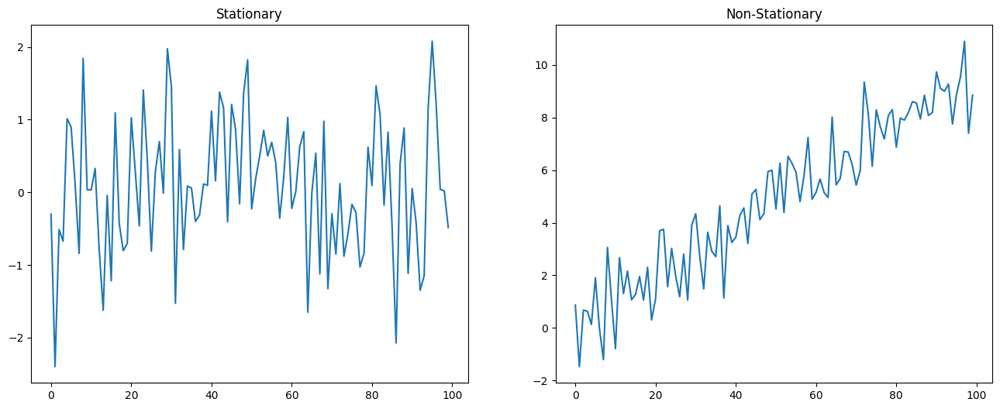

In [ ]:
def generate_data(mean, std_dev):
    return np.random.normal(loc=mean, scale=std_dev)

T = 100
A = pd.Series([generate_data(0, 1) for _ in range(T)], name='A')  # Stationary
B = pd.Series([generate_data(t * 0.1, 1) for t in range(T)], name='B')  # Non-stationary

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
ax1.plot(A); ax1.set_title('Stationary')
ax2.plot(B); ax2.set_title('Non-Stationary')
plt.show()

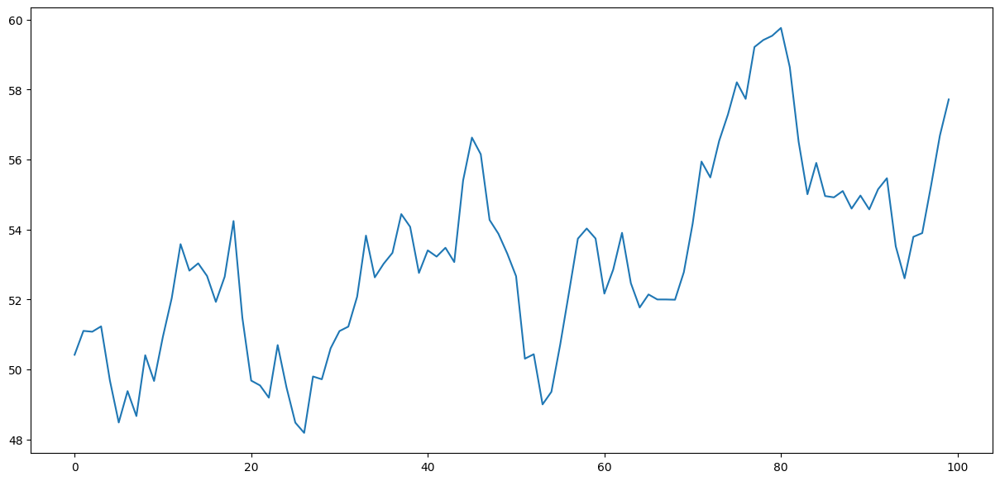

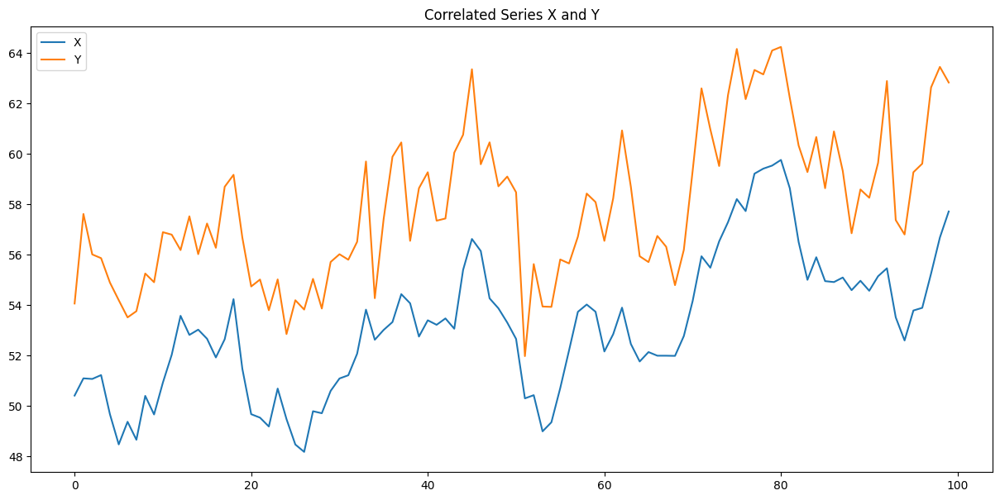

In [ ]:
Xreturns = np.random.normal(0, 1, 100)
X = pd.Series(np.cumsum(Xreturns), name='X') + 50
X.plot(figsize=(15, 7))

noise = np.random.normal(0, 1, 100)
Y = X + 5 + noise
Y.name = 'Y'

pd.concat([X, Y], axis=1).plot(figsize=(15, 7))
plt.title('Correlated Series X and Y')
plt.show()

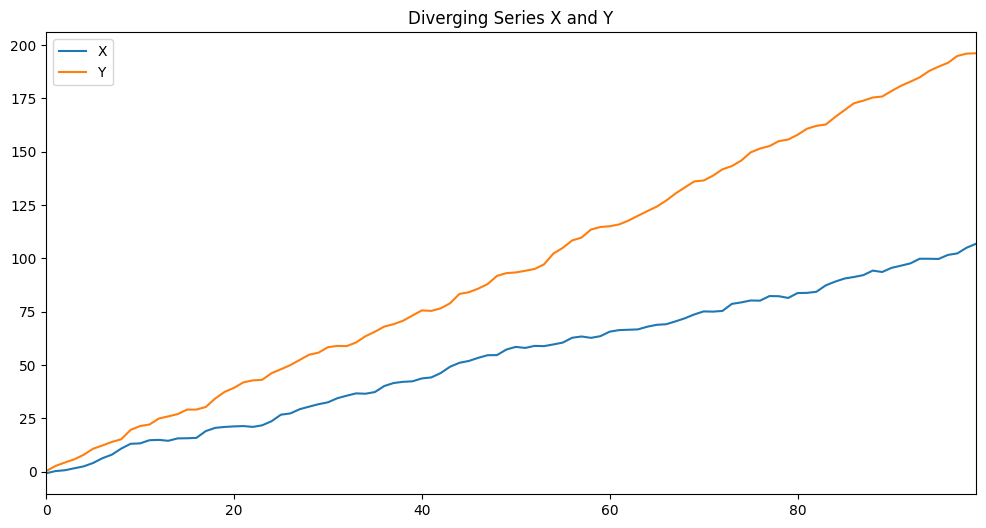

In [ ]:
X_returns = np.random.normal(1, 1, 100)
Y_returns = np.random.normal(2, 1, 100)

X_diverging = pd.Series(np.cumsum(X_returns), name='X')
Y_diverging = pd.Series(np.cumsum(Y_returns), name='Y')

pd.concat([X_diverging, Y_diverging], axis=1).plot(figsize=(12, 6))
plt.xlim(0, 99)
plt.title('Diverging Series X and Y')
plt.show()

In [ ]:
print('Correlation: ' + str(X_diverging.corr(Y_diverging)))
score, pvalue, _ = coint(X_diverging, Y_diverging)
print('Cointegration test p-value: ' + str(pvalue))

Correlation: 0.9961784626905197
Cointegration test p-value: 0.5385077011795898


Analyzing pair: COF and VST
Correlation between COF and VST: 0.0994384777245032
Cointegration test p-value: 0.04981270789306088


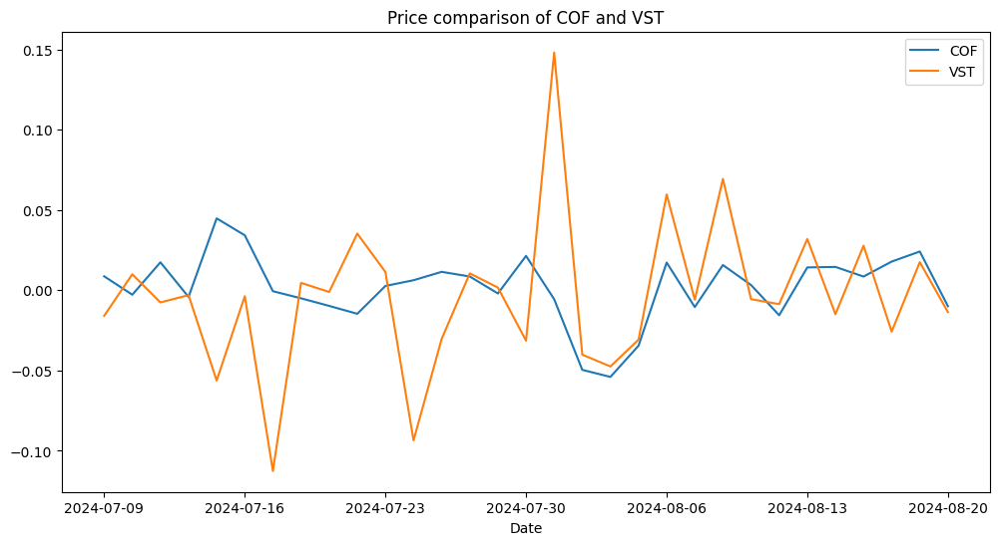

Analyzing pair: DFS and WELL
Correlation between DFS and WELL: 0.10059332069717014
Cointegration test p-value: 0.04987206607871882


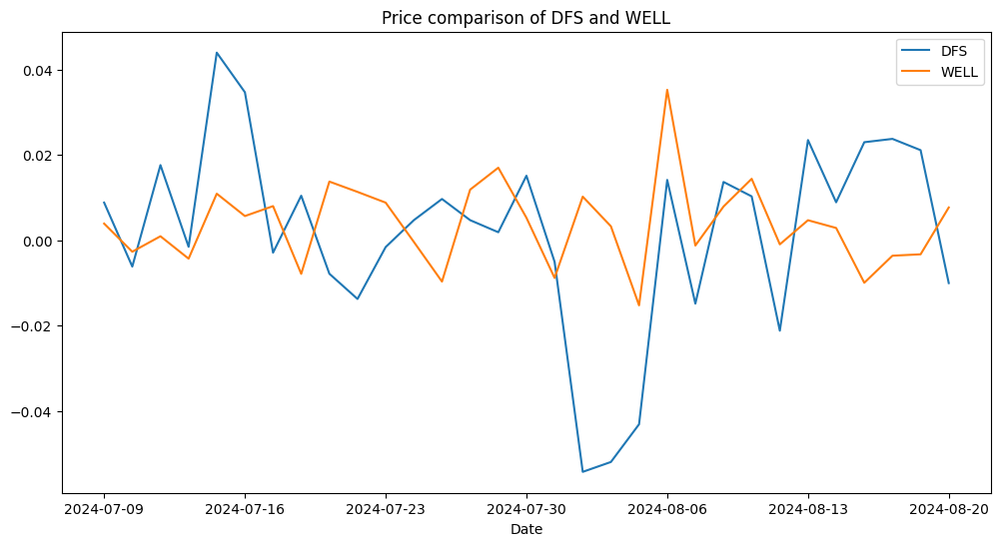

Analyzing pair: ETSY and GPC
Correlation between ETSY and GPC: 0.5533102196585875
Cointegration test p-value: 0.04990613981350839


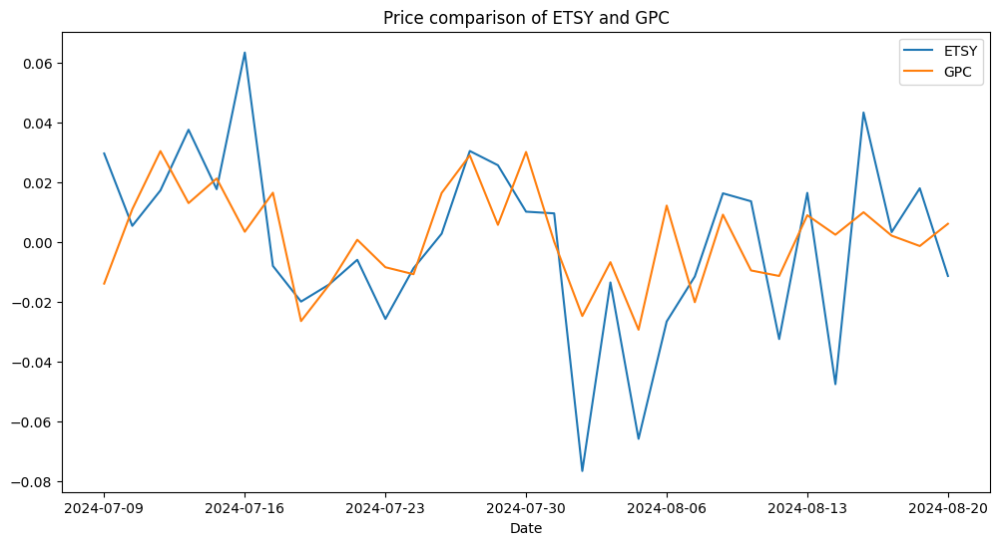

Analyzing pair: ALB and POOL
Correlation between ALB and POOL: 0.3782260134516626
Cointegration test p-value: 0.049919485269023636


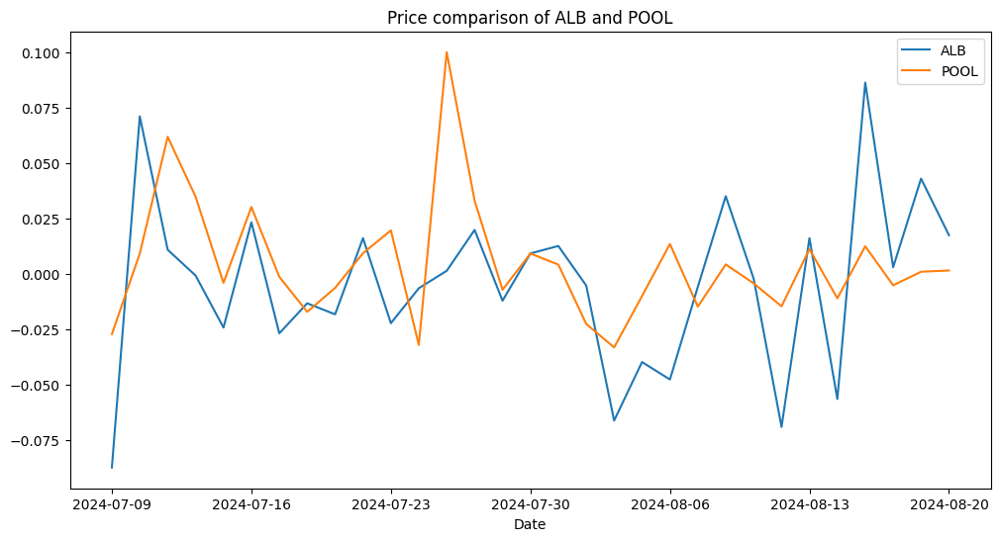

Analyzing pair: HUBB and HUM
Correlation between HUBB and HUM: -0.09366551554270924
Cointegration test p-value: 0.049965693580728256


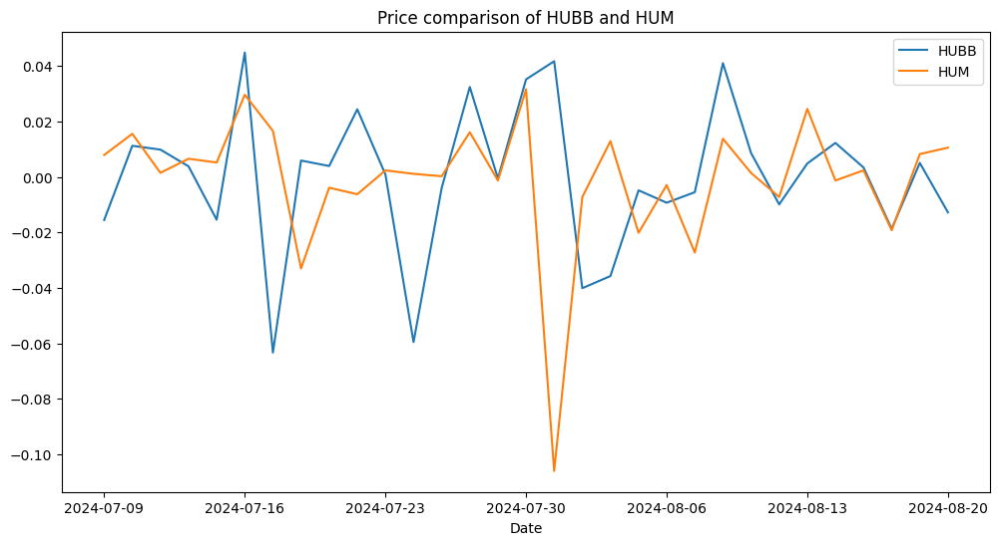

In [ ]:
tickers = ['COF', 'VST', 'DFS', 'WELL', 'ETSY', 'GPC', 'ALB', 'POOL', 'HUBB', 'HUM']

selected_data = returns[tickers]

from statsmodels.tsa.stattools import coint

for i in range(0, len(tickers), 2):
    ticker1, ticker2 = tickers[i], tickers[i+1]
    print(f'Analyzing pair: {ticker1} and {ticker2}')

    # Calculate correlation
    corr = returns[ticker1].corr(returns[ticker2])
    print(f'Correlation between {ticker1} and {ticker2}: {corr}')

    # Cointegration test
    score, pvalue, _ = coint(returns[ticker1], returns[ticker2])
    print(f'Cointegration test p-value: {pvalue}')

    pd.concat([selected_data[ticker1], selected_data[ticker2]], axis=1).plot(figsize=(12,6))
    plt.title(f'Price comparison of {ticker1} and {ticker2}')
    plt.show()


In [ ]:
df['Adj Close'] = pd.to_numeric(df['Adj Close'], errors='coerce')
df.replace([np.inf, -np.inf], np.nan, inplace=True)

mean_value = df['Adj Close'].mean()
df['Adj Close'].fillna(mean_value, inplace=True)

In [ ]:
import optuna
from pykalman import KalmanFilter
from sklearn.metrics import mean_squared_error

def kalman_filter_hedge_ratio(Y, X, transition_covariance):
    delta = 1e-5  # Small delta for adjustment
    trans_cov = transition_covariance * np.eye(2)  # State transition covariance

    obs_mat = np.vstack([X.to_numpy().astype(float), np.ones(len(X))]).T[:, np.newaxis]

    kf = KalmanFilter(n_dim_obs=1, n_dim_state=2,
                      initial_state_mean=[0, 0],
                      initial_state_covariance=np.ones((2, 2)),
                      transition_matrices=np.eye(2),
                      observation_matrices=obs_mat,
                      observation_covariance=1.0,
                      transition_covariance=trans_cov)

    # Converting Y to a numpy array
    state_means, _ = kf.filter(Y.to_numpy())
    hedge_ratio = state_means[:, 0]  # The dynamic hedge ratio is the first state variable
    return hedge_ratio

def objective(trial):
    transition_covariance = trial.suggest_float('transition_covariance', 0.1, 1.0)

    np.random.seed(42)
    Y = pd.Series(np.random.randn(100))
    X = pd.Series(np.random.randn(100))

    hedge_ratio = kalman_filter_hedge_ratio(Y, X, transition_covariance)

    mse = mean_squared_error(Y, hedge_ratio)  # Adjust Y if necessary for evaluation
    return mse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000)  # Adjust the number of trials as needed

print(f"Best Transition Covariance: {study.best_params['transition_covariance']}")
print(f"Best MSE: {study.best_value}")

[I 2024-10-04 07:46:26,242] A new study created in memory with name: no-name-86a06b67-f274-4f93-b908-87fa49a0c582
[I 2024-10-04 07:46:26,359] Trial 0 finished with value: 0.7922199112340116 and parameters: {'transition_covariance': 0.4085368934917728}. Best is trial 0 with value: 0.7922199112340116.
[I 2024-10-04 07:46:26,460] Trial 1 finished with value: 0.789927311284572 and parameters: {'transition_covariance': 0.3684038799286167}. Best is trial 1 with value: 0.789927311284572.
[I 2024-10-04 07:46:26,573] Trial 2 finished with value: 0.8148073721649066 and parameters: {'transition_covariance': 0.8022335407301375}. Best is trial 1 with value: 0.789927311284572.
[I 2024-10-04 07:46:26,701] Trial 3 finished with value: 0.8078150172408333 and parameters: {'transition_covariance': 0.6776471793420283}. Best is trial 1 with value: 0.789927311284572.
[I 2024-10-04 07:46:26,812] Trial 4 finished with value: 0.8132525144137375 and parameters: {'transition_covariance': 0.774173585189928}. Best

Best Transition Covariance: 0.12389467583007861
Best MSE: 0.7797860061975651


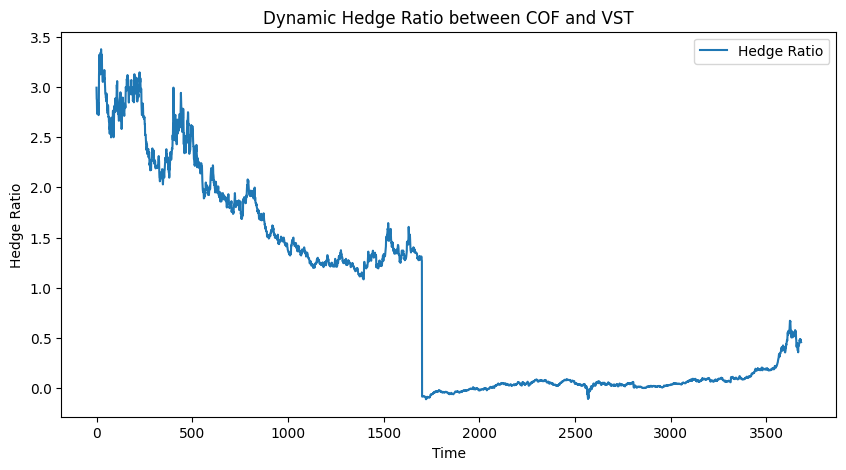

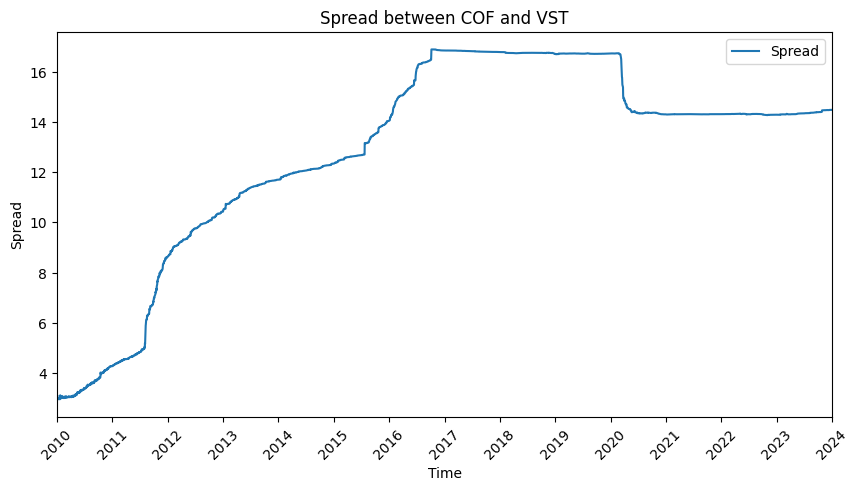

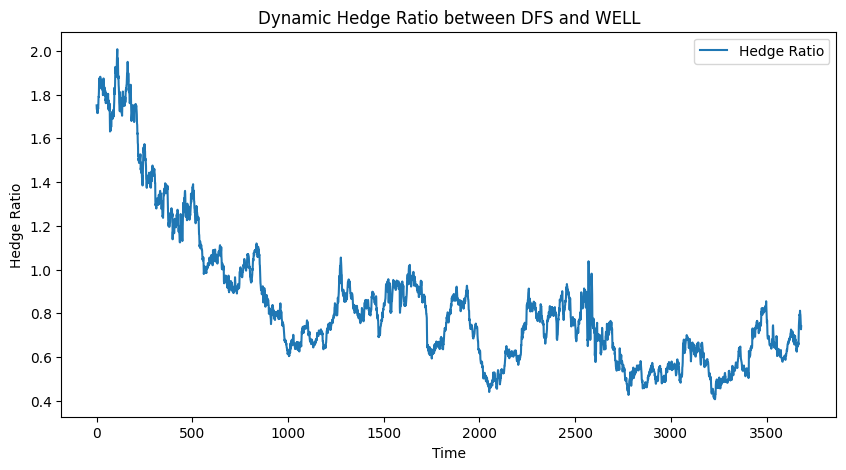

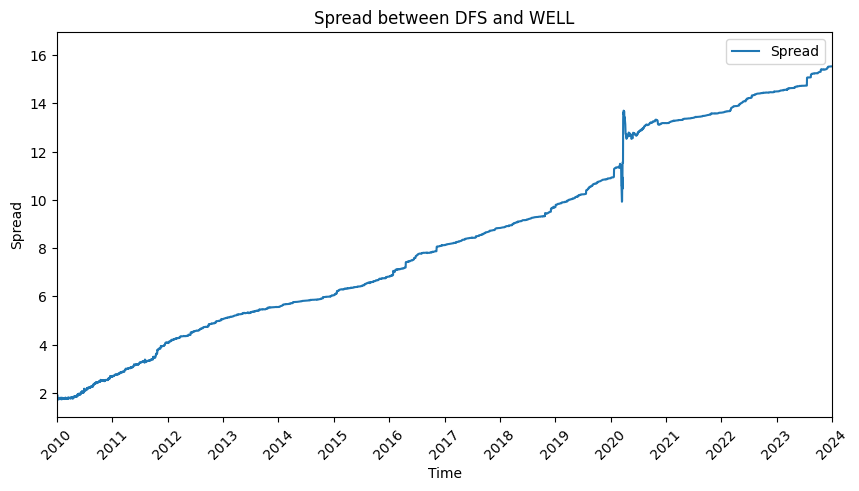

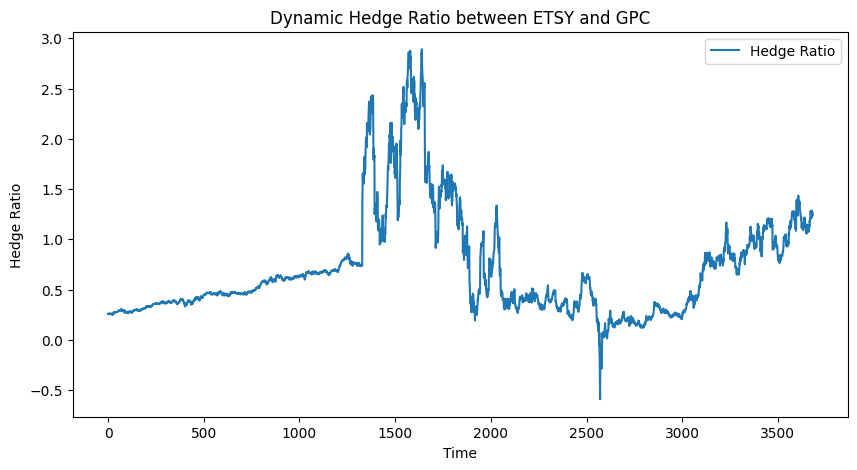

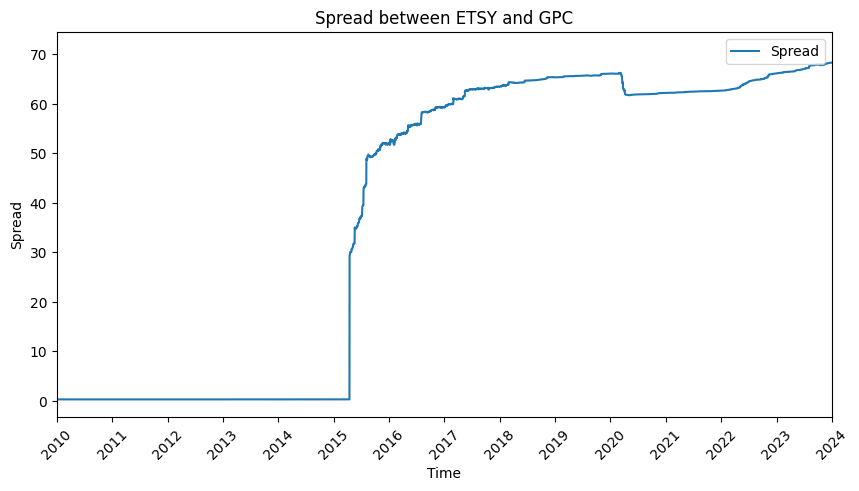

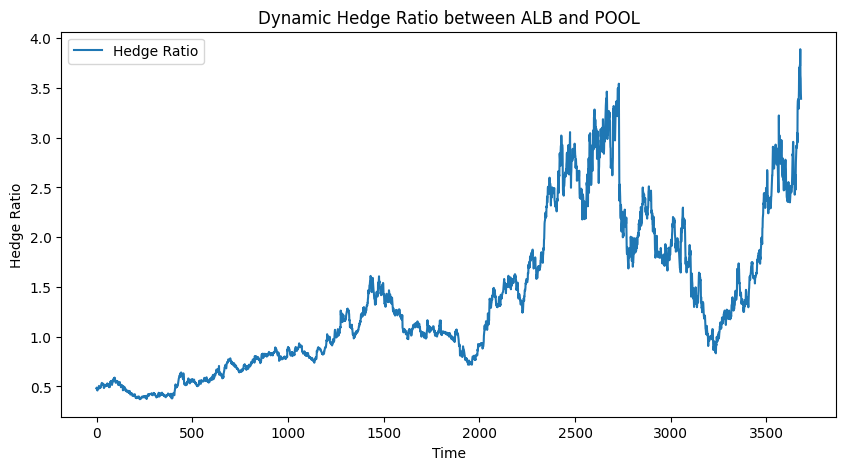

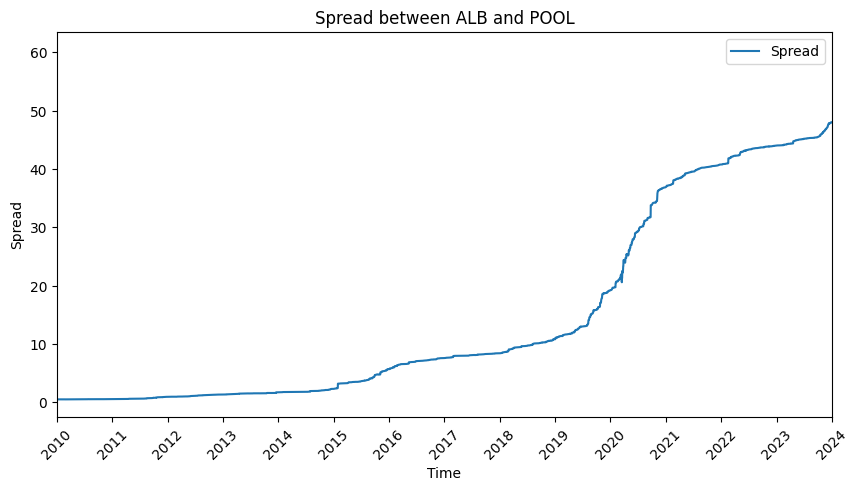

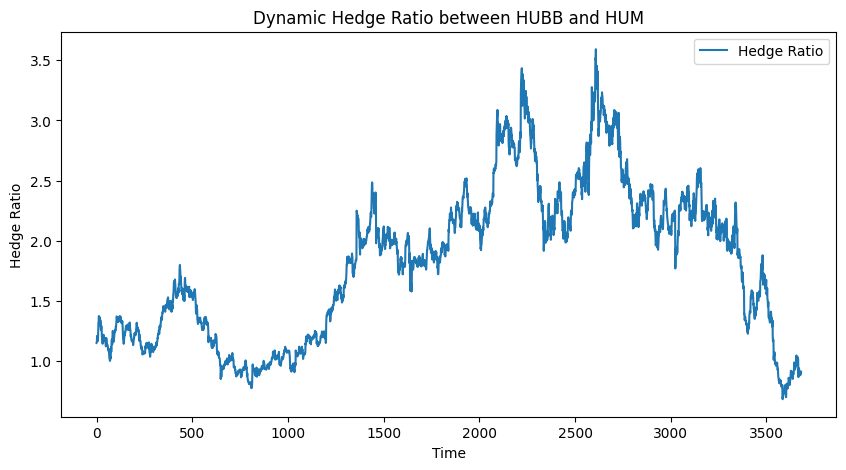

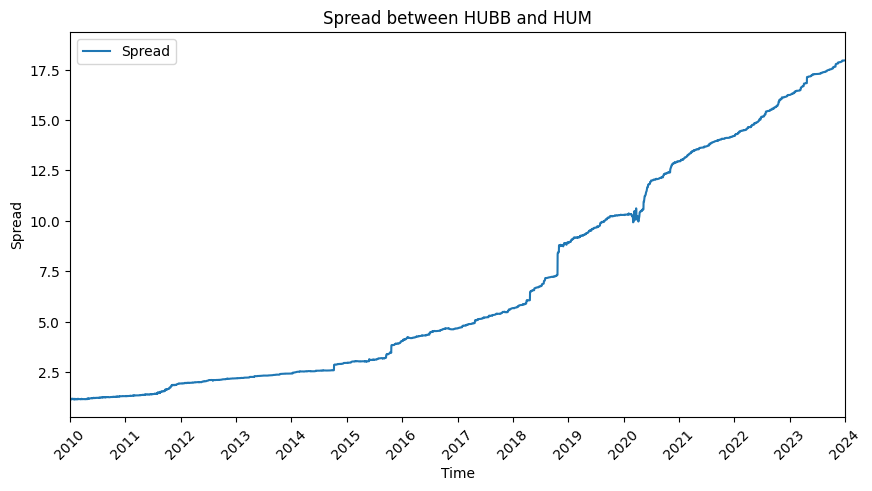

In [ ]:
pairs = [
    ('COF', 'VST'),
    ('DFS', 'WELL'),
    ('ETSY', 'GPC'),
    ('ALB', 'POOL'),
    ('HUBB', 'HUM')
]
best_cov = study.best_params['transition_covariance']

for ticker1, ticker2 in pairs:
    X = df.loc[df['Symbol'] == ticker1, 'Adj Close']
    Y = df.loc[df['Symbol'] == ticker2, 'Adj Close']

    # Geting the hedge ratio using the best parameters
    hedge_ratio = kalman_filter_hedge_ratio(Y, X, best_cov)

    # Plotting the hedge ratio
    plt.figure(figsize=(10, 5))
    plt.plot(hedge_ratio, label='Hedge Ratio')
    plt.title(f'Dynamic Hedge Ratio between {ticker1} and {ticker2}')
    plt.xlabel('Time')
    plt.ylabel('Hedge Ratio')
    plt.legend()
    plt.show()

    #the index is datetime if it's not already
    Y.index = pd.to_datetime(Y.index)
    X.index = pd.to_datetime(X.index)

    # spread
    spread = Y - hedge_ratio * X

    # Plotting the spread
    plt.figure(figsize=(10, 5))
    plt.plot(spread, label='Spread')
    plt.title(f'Spread between {ticker1} and {ticker2}')
    plt.xlabel('Time')
    plt.ylabel('Spread')

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45)

    plt.xlim(pd.Timestamp('2010-01-01'), pd.Timestamp('2024-01-01'))
    plt.legend()
    plt.show()

In [ ]:
entry_threshold = 2.5  # Enter at more extreme levels
exit_threshold = 1.0  # Exit earlier at 1.0
profit_target = 0.02  # Close trade when 2% profit is achieved
stop_loss_threshold = 0.03  # Cut losses at 3%
# Initialize dictionary to store signals and metrics
signals_dict = {}
performance_metrics = {}

# Function to calculate performance metrics (same as before)
def calculate_sharpe_ratio(returns, risk_free_rate=0):
    excess_returns = returns - risk_free_rate
    return np.sqrt(252) * (excess_returns.mean() / excess_returns.std())

def calculate_drawdown(returns):
    cum_returns = (1 + returns).cumprod()
    drawdown = cum_returns / cum_returns.cummax() - 1
    max_drawdown = drawdown.min()
    max_dd_duration = (drawdown < 0).astype(int).groupby(drawdown.ne(0).cumsum()).cumsum().max()
    return max_drawdown, max_dd_duration


for ticker1, ticker2 in pairs:
    # Get adjusted close prices
    X = df.loc[df['Symbol'] == ticker1, 'Adj Close']
    Y = df.loc[df['Symbol'] == ticker2, 'Adj Close']

    # Ensure correct datetime index
    X.index = pd.to_datetime(X.index)
    Y.index = pd.to_datetime(Y.index)

    # Hedge ratio using Kalman Filter
    # Added best_cov as an argument. You may need to define best_cov
    # based on your optimization results.
    hedge_ratio = kalman_filter_hedge_ratio(Y, X, best_cov)

    # Create spread
    spread = Y - hedge_ratio * X

    # Rolling statistics for Z-score
    rolling_mean = spread.rolling(window=30).mean()
    rolling_std = spread.rolling(window=30).std()
    zscore = (spread - rolling_mean) / rolling_std
    # Signal generation with filters
    signals = pd.DataFrame(index=spread.index)
    signals['spread'] = spread
    signals['positions'] = 0

    # Long signal with entry filter
    long_signal = (zscore < -entry_threshold) & (spread.pct_change().abs() < 0.01)  # Low volatility filter
    signals.loc[long_signal, 'positions'] = 1

    # Short signal with entry filter
    short_signal = (zscore > entry_threshold) & (spread.pct_change().abs() < 0.01)  # Low volatility filter
    signals.loc[short_signal, 'positions'] = -1

    # Exit condition
    exit_signal = (zscore.abs() < exit_threshold) | (spread.pct_change().abs() >= profit_target)  # Exit early
    signals.loc[exit_signal, 'positions'] = 0

    # Stop-loss condition
    stop_loss = (spread.pct_change().abs() >= stop_loss_threshold)
    signals.loc[stop_loss, 'positions'] = 0

    # Calculate returns
    returns = signals['spread'].pct_change().dropna()

    # Evaluate performance
    sharpe_ratio = calculate_sharpe_ratio(returns)
    max_drawdown, max_dd_duration = calculate_drawdown(returns)
    performance_metrics[(ticker1, ticker2)] = {
        'sharpe_ratio': sharpe_ratio,
        'max_drawdown': max_drawdown,
        'max_dd_duration': max_dd_duration,
        'total_trades': signals['positions'].diff().abs().sum() / 2
    }
    # Store signals for plotting
    signals_dict[(ticker1, ticker2)] = signals

In [ ]:
print(signals_dict)

{('COF', 'VST'):                spread  positions
Date                            
2010-01-04   3.084995          0
2010-01-05   2.960459          0
2010-01-06   2.983109          0
2010-01-07   2.952052          0
2010-01-08   2.989625          0
...               ...        ...
2024-08-14  14.734742          0
2024-08-15  14.734541          0
2024-08-16  14.740114          0
2024-08-19  14.741925          0
2024-08-20  14.741222          0

[3682 rows x 2 columns], ('DFS', 'WELL'):                spread  positions
Date                            
2010-01-04   1.888077          0
2010-01-05   1.737145          0
2010-01-06   1.749602          0
2010-01-07   1.744458          0
2010-01-08   1.739646          0
...               ...        ...
2024-08-14  16.208066          0
2024-08-15  16.216061          0
2024-08-16  16.223864          0
2024-08-19  16.229650          0
2024-08-20  16.233756          0

[3682 rows x 2 columns], ('ETSY', 'GPC'):                spread  positions
Date  

In [ ]:
print(performance_metrics)

{('COF', 'VST'): {'sharpe_ratio': 1.8774679977228608, 'max_drawdown': -0.15503338937424438, 'max_dd_duration': 1, 'total_trades': 80.0}, ('DFS', 'WELL'): {'sharpe_ratio': 1.575497282184741, 'max_drawdown': -0.13671993914012037, 'max_dd_duration': 1, 'total_trades': 76.0}, ('ETSY', 'GPC'): {'sharpe_ratio': 0.2638052745479185, 'max_drawdown': -0.06825206273287154, 'max_dd_duration': 1, 'total_trades': 89.0}, ('ALB', 'POOL'): {'sharpe_ratio': 2.8962497185715126, 'max_drawdown': -0.06154162337625679, 'max_dd_duration': 1, 'total_trades': 93.0}, ('HUBB', 'HUM'): {'sharpe_ratio': 2.4619163764759167, 'max_drawdown': -0.06167503209712499, 'max_dd_duration': 1, 'total_trades': 86.0}}


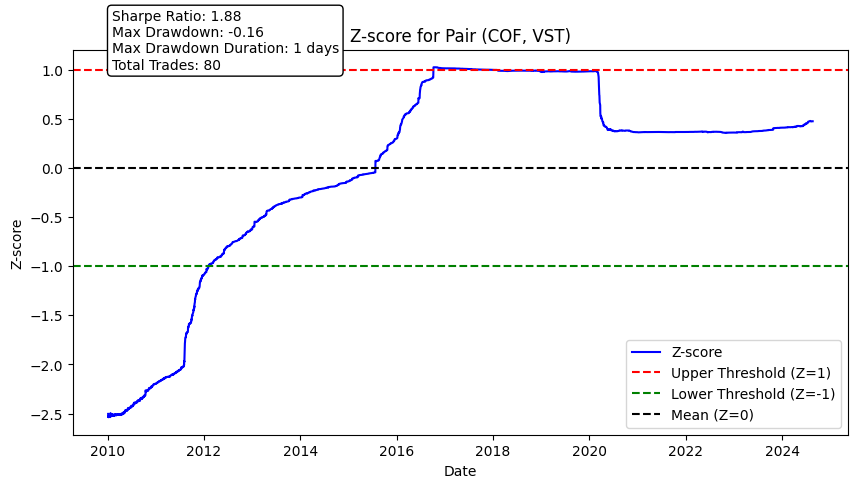

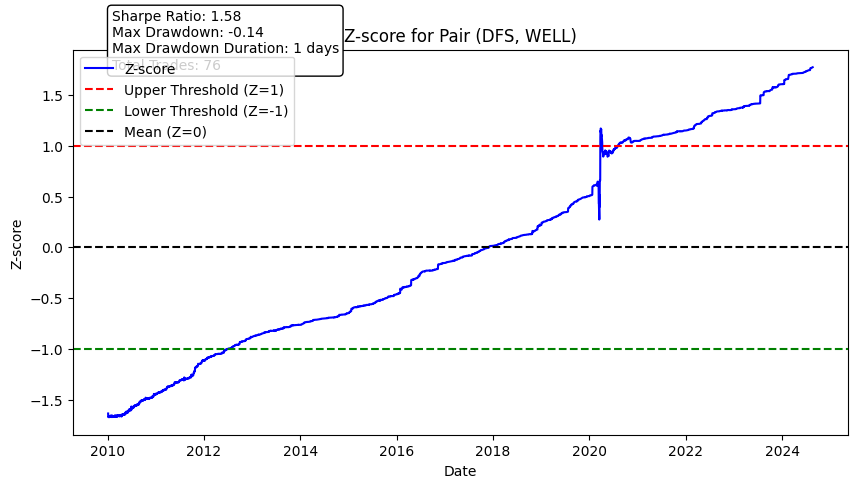

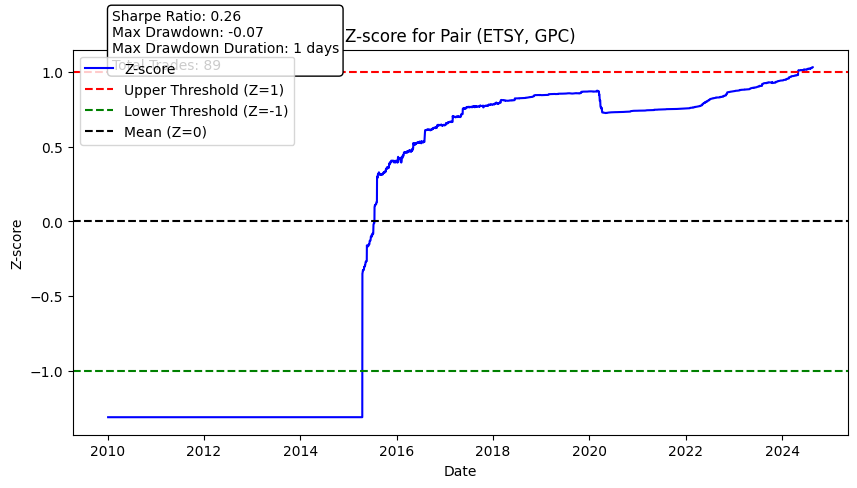

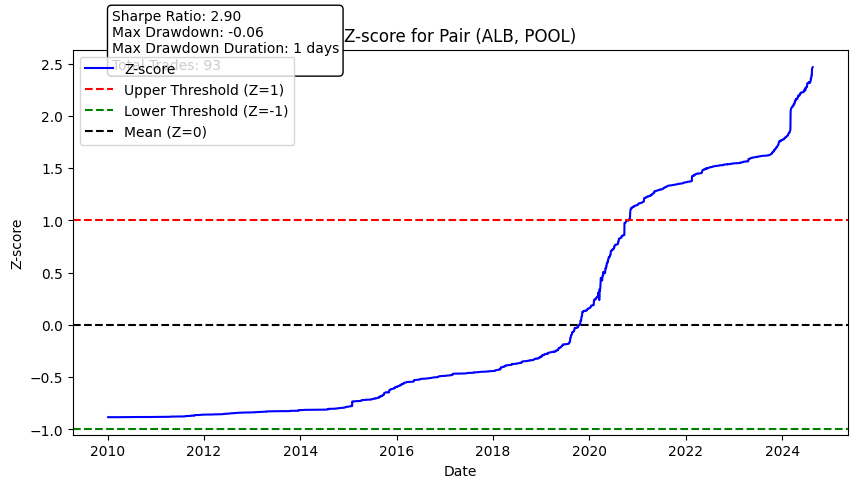

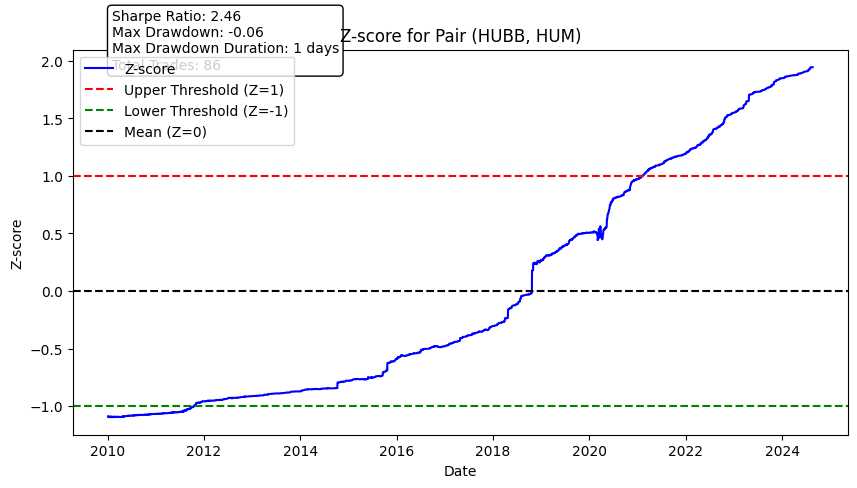

In [ ]:
# Plotting the Z-score and performance metrics
for (ticker1, ticker2), signals in signals_dict.items():
    z_score = (signals['spread'] - signals['spread'].mean()) / signals['spread'].std()

    # Create the plot
    plt.figure(figsize=(10, 5))
    plt.plot(signals.index, z_score, label='Z-score', color='blue')
    plt.axhline(1, color='red', linestyle='--', label='Upper Threshold (Z=1)')
    plt.axhline(-1, color='green', linestyle='--', label='Lower Threshold (Z=-1)')
    plt.axhline(0, color='black', linestyle='--', label='Mean (Z=0)')
    plt.title(f'Z-score for Pair ({ticker1}, {ticker2})')
    plt.xlabel('Date')
    plt.ylabel('Z-score')
    plt.legend()

    # Annotate performance metrics on the plot
    if (ticker1, ticker2) in performance_metrics:
        performance_text = (
            f"Sharpe Ratio: {performance_metrics[(ticker1, ticker2)]['sharpe_ratio']:.2f}\n"
            f"Max Drawdown: {performance_metrics[(ticker1, ticker2)]['max_drawdown']:.2f}\n"
            f"Max Drawdown Duration: {performance_metrics[(ticker1, ticker2)]['max_dd_duration']} days\n"
            f"Total Trades: {performance_metrics[(ticker1, ticker2)]['total_trades']:.0f}"
        )
    else:
        performance_text = f"Performance metrics not available for ({ticker1}, {ticker2})."

    plt.annotate(performance_text, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10,
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white"))

    plt.show()

In [ ]:
# Summarize results
for pair, metrics in performance_metrics.items():
    print(f'Performance for pair {pair}:')
    print(f"Sharpe Ratio: {metrics['sharpe_ratio']:.2f}")
    print(f"Max Drawdown: {metrics['max_drawdown']:.2%}")
    print(f"Max Drawdown Duration: {metrics['max_dd_duration']} days")
    print(f"Total Trades: {metrics['total_trades']}")
    print('-' * 50)

Performance for pair ('COF', 'VST'):
Sharpe Ratio: 1.88
Max Drawdown: -15.50%
Max Drawdown Duration: 1 days
Total Trades: 80.0
--------------------------------------------------
Performance for pair ('DFS', 'WELL'):
Sharpe Ratio: 1.58
Max Drawdown: -13.67%
Max Drawdown Duration: 1 days
Total Trades: 76.0
--------------------------------------------------
Performance for pair ('ETSY', 'GPC'):
Sharpe Ratio: 0.26
Max Drawdown: -6.83%
Max Drawdown Duration: 1 days
Total Trades: 89.0
--------------------------------------------------
Performance for pair ('ALB', 'POOL'):
Sharpe Ratio: 2.90
Max Drawdown: -6.15%
Max Drawdown Duration: 1 days
Total Trades: 93.0
--------------------------------------------------
Performance for pair ('HUBB', 'HUM'):
Sharpe Ratio: 2.46
Max Drawdown: -6.17%
Max Drawdown Duration: 1 days
Total Trades: 86.0
--------------------------------------------------


In [ ]:
from scipy.stats import scoreatpercentile

# Risk Measures: Calculate VaR and CVaR for each pair
confidence_level = 0.95  # Define confidence level (e.g., 95%)
percentile = 100 * (1 - confidence_level)  # e.g., 5th percentile for 95% VaR

for (ticker1, ticker2), signals in signals_dict.items():
    # Calculate daily percentage returns of the spread
    daily_returns = signals['spread'].pct_change()

    # Calculate VaR using scipy.stats.scoreatpercentile
    var = scoreatpercentile(daily_returns.dropna(), percentile)

    # Example CVaR calculation (replace this with your actual CVaR logic)
    cvar = daily_returns[daily_returns <= var].mean()

    print(f"VaR for {ticker1}-{ticker2}: {var}")
    print(f"CVaR for {ticker1}-{ticker2}: {cvar}")

VaR for COF-VST: -0.001036584957541553
CVaR for COF-VST: -0.004677293352362088
VaR for DFS-WELL: -0.0023853981904911055
CVaR for DFS-WELL: -0.010029637360147654
VaR for ETSY-GPC: -0.003282004655189795
CVaR for ETSY-GPC: -0.005351584139359994
VaR for ALB-POOL: -0.0022914225132700757
CVaR for ALB-POOL: -0.005178046951508264
VaR for HUBB-HUM: -0.0025793958725150996
CVaR for HUBB-HUM: -0.006424577691859743


In [ ]:
import vectorbt as vbt

backtest_results = {}

for (ticker1, ticker2), signals in signals_dict.items():
    # Fetch prices for the pair (Assume X and Y are adjusted close prices as before)
    X = df.loc[df['Symbol'] == ticker1, 'Adj Close']
    Y = df.loc[df['Symbol'] == ticker2, 'Adj Close']

    # Ensuring correct datetime index
    X.index = pd.to_datetime(X.index)
    Y.index = pd.to_datetime(Y.index)

    # Calculate spread
    hedge_ratio = kalman_filter_hedge_ratio(Y, X, best_cov)
    spread = Y - hedge_ratio * X

    # Record entry price
    entry_price = spread.where(signals['positions'].diff() != 0).ffill()

    # Check stop-loss and take-profit conditions
    stop_loss_exit = abs((spread - entry_price) / entry_price) >= stop_loss_threshold
    take_profit_exit = abs((spread - entry_price) / entry_price) >= profit_target

    # Combine stop-loss, take-profit, and exit signals
    final_exit_signals = (signals['positions'] == 0) | stop_loss_exit | take_profit_exit

    # Backtest using signals
    pf = vbt.Portfolio.from_signals(
        close=spread,
        entries=signals['positions'] == 1,
        short_entries=signals['positions'] == -1,
        exits=final_exit_signals,
        short_exits=final_exit_signals,
        init_cash=1000000,
    )

    # Store performance and metrics for each pair
    backtest_results[(ticker1, ticker2)] = pf

    # Display summary for each pair
    print(f"Backtest results for pair {ticker1}/{ticker2}:")
    print(pf.stats())

    # Plot the performance with vectorbt's built-in Plotly graph
    pf.plot().show()

# Now backtest_results contain the backtest portfolios for each pair


Backtest results for pair COF/VST:
Start                         2010-01-04 00:00:00
End                           2024-08-20 00:00:00
Period                                       3682
Start Value                             1000000.0
End Value                           804471.569374
Total Return [%]                       -19.552843
Benchmark Return [%]                   377.836101
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        21.798553
Max Drawdown Duration                      3352.0
Total Trades                                   80
Total Closed Trades                            80
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                                 37.5
Best Trade [%]                           1.110791
Worst Trade [%]                        -12.902983
Avg Winning Trade [%]                    0.107551
Avg Losing Trad

Backtest results for pair DFS/WELL:
Start                         2010-01-04 00:00:00
End                           2024-08-20 00:00:00
Period                                       3682
Start Value                             1000000.0
End Value                           990003.734145
Total Return [%]                        -0.999627
Benchmark Return [%]                   759.803779
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                         7.971117
Max Drawdown Duration                      1107.0
Total Trades                                   76
Total Closed Trades                            76
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            47.368421
Best Trade [%]                           9.931627
Worst Trade [%]                         -6.377078
Avg Winning Trade [%]                     0.34281
Avg Losing Tra

Backtest results for pair ETSY/GPC:
Start                         2010-01-04 00:00:00
End                           2024-08-20 00:00:00
Period                                       3682
Start Value                             1000000.0
End Value                          1073918.247606
Total Return [%]                         7.391825
Benchmark Return [%]                 27333.926337
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                         6.647991
Max Drawdown Duration                      2351.0
Total Trades                                   89
Total Closed Trades                            89
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            59.550562
Best Trade [%]                           1.360607
Worst Trade [%]                         -2.020751
Avg Winning Trade [%]                    0.333525
Avg Losing Tra

Backtest results for pair ALB/POOL:
Start                         2010-01-04 00:00:00
End                           2024-08-20 00:00:00
Period                                       3682
Start Value                             1000000.0
End Value                           780479.504299
Total Return [%]                        -21.95205
Benchmark Return [%]                 12074.150041
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        25.284724
Max Drawdown Duration                      3353.0
Total Trades                                   93
Total Closed Trades                            93
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            40.860215
Best Trade [%]                           1.396005
Worst Trade [%]                         -4.213566
Avg Winning Trade [%]                    0.187787
Avg Losing Tra

Backtest results for pair HUBB/HUM:
Start                         2010-01-04 00:00:00
End                           2024-08-20 00:00:00
Period                                       3682
Start Value                             1000000.0
End Value                           915677.142543
Total Return [%]                        -8.432286
Benchmark Return [%]                  1463.438601
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        13.771402
Max Drawdown Duration                      3281.0
Total Trades                                   86
Total Closed Trades                            86
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            47.674419
Best Trade [%]                           1.982711
Worst Trade [%]                         -4.051513
Avg Winning Trade [%]                    0.258262
Avg Losing Tra

In [ ]:
pf.orders.records_readable

,Order Id,Column,Timestamp,Size,Price,Fees,Side
0,0,0,2010-04-16,322177.161405,3.103882,0.0,Sell
1,1,0,2010-04-19,322177.161405,3.076601,0.0,Buy
2,2,0,2010-04-27,322085.252134,3.132057,0.0,Sell
3,3,0,2010-04-28,322085.252134,3.097266,0.0,Buy
4,4,0,2010-05-14,315571.342994,3.232216,0.0,Sell
...,...,...,...,...,...,...,...
155,155,0,2024-04-23,55351.333873,14.544026,0.0,Buy
156,156,0,2024-06-11,55128.071737,14.594405,0.0,Sell
157,157,0,2024-06-14,55128.071737,14.592816,0.0,Buy
158,158,0,2024-06-17,55079.080108,14.608977,0.0,Sell


In [ ]:
pf.positions.plot(close_trace_kwargs=dict(visible=False)).show()

In [ ]:
import vectorbt as vbt

close_price = df.loc[df['Symbol'].isin(['ETSY','GPC']), 'Adj Close']

ma = vbt.MA.run(close_price, window=20)
ema = vbt.MA.run(close_price, window=20, ewm=True)

fig = pf.positions.plot(close_trace_kwargs=dict(visible=False))

ma.ma.vbt.plot(trace_kwargs=dict(name='MA (20)'), fig=fig)
ema.ma.vbt.plot(trace_kwargs=dict(name='EMA (20)'), fig=fig)

fig.show()

In [ ]:
# Convert stats_dict to a DataFrame for easier comparison
stats_df = pd.DataFrame({(ticker1, ticker2): pf.stats() for (ticker1, ticker2), pf in backtest_results.items()}).T

# Display the DataFrame to inspect all the stats
print(stats_df)

# Define a ranking system based on performance metrics
# Adjust ranking criteria based on keys in stats_df
ranking_criteria = (
    stats_df['Total Return [%]'].rank(ascending=False) +   # Higher total return is better
    stats_df['Max Drawdown [%]'].rank(ascending=True)      # Lower max drawdown is better
)


                         Start                  End Period Start Value  \
COF  VST   2010-01-04 00:00:00  2024-08-20 00:00:00   3682   1000000.0   
DFS  WELL  2010-01-04 00:00:00  2024-08-20 00:00:00   3682   1000000.0   
ETSY GPC   2010-01-04 00:00:00  2024-08-20 00:00:00   3682   1000000.0   
ALB  POOL  2010-01-04 00:00:00  2024-08-20 00:00:00   3682   1000000.0   
HUBB HUM   2010-01-04 00:00:00  2024-08-20 00:00:00   3682   1000000.0   

                End Value Total Return [%] Benchmark Return [%]  \
COF  VST    804471.569374       -19.552843           377.836101   
DFS  WELL   990003.734145        -0.999627           759.803779   
ETSY GPC   1073918.247606         7.391825         27333.926337   
ALB  POOL   780479.504299        -21.95205         12074.150041   
HUBB HUM    915677.142543        -8.432286          1463.438601   

          Max Gross Exposure [%] Total Fees Paid Max Drawdown [%]  ...  \
COF  VST                   100.0             0.0        21.798553  ...   
DFS 

In [ ]:
# Define the pair to check
pair_to_check = ('ETSY', 'GPC')

# Check if the pair exists in the DataFrame and print its stats
if pair_to_check in stats_df.index:
    pair_stats = stats_df.loc[pair_to_check]
    print(f'\033[1mStats for the Best pair {pair_to_check}:\033[0m')
    print(pair_stats)
else:
    print(f'Pair {pair_to_check} not found in the stats DataFrame.')


Stats for the Best pair ('ETSY', 'GPC'):
Start                         2010-01-04 00:00:00
End                           2024-08-20 00:00:00
Period                                       3682
Start Value                             1000000.0
End Value                          1073918.247606
Total Return [%]                         7.391825
Benchmark Return [%]                 27333.926337
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                         6.647991
Max Drawdown Duration                      2351.0
Total Trades                                   89
Total Closed Trades                            89
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            59.550562
Best Trade [%]                           1.360607
Worst Trade [%]                         -2.020751
Avg Winning Trade [%]                    0.333525
Avg Losin

In [ ]:
X = df.loc[df['Symbol'] == 'ETSY', 'Adj Close']
Y = df.loc[df['Symbol'] == 'GPC', 'Adj Close']
X.vbt.plot_against(Y).show()

In [ ]:
# Ensure data is aligned and merged based on the Date (or index if appropriate)
price_data = X + Y  # Combine the adjusted close prices

# Plot drawdowns of the combined price data using vectorbt
price_data.vbt.drawdowns.plot(top_n=3).show()

In [ ]:
!pip install -U kaleido

In [ ]:
close_price = df.loc[df['Symbol'].isin(['ETSY','GPC']), 'Adj Close']
pf = vbt.Portfolio.from_random_signals(close_price, n=5)
pf.plot(subplots=['cash', 'assets', 'value']).show()


Plotting returns for the pair: COF and VST

Showing comparison between COF and VST returns.



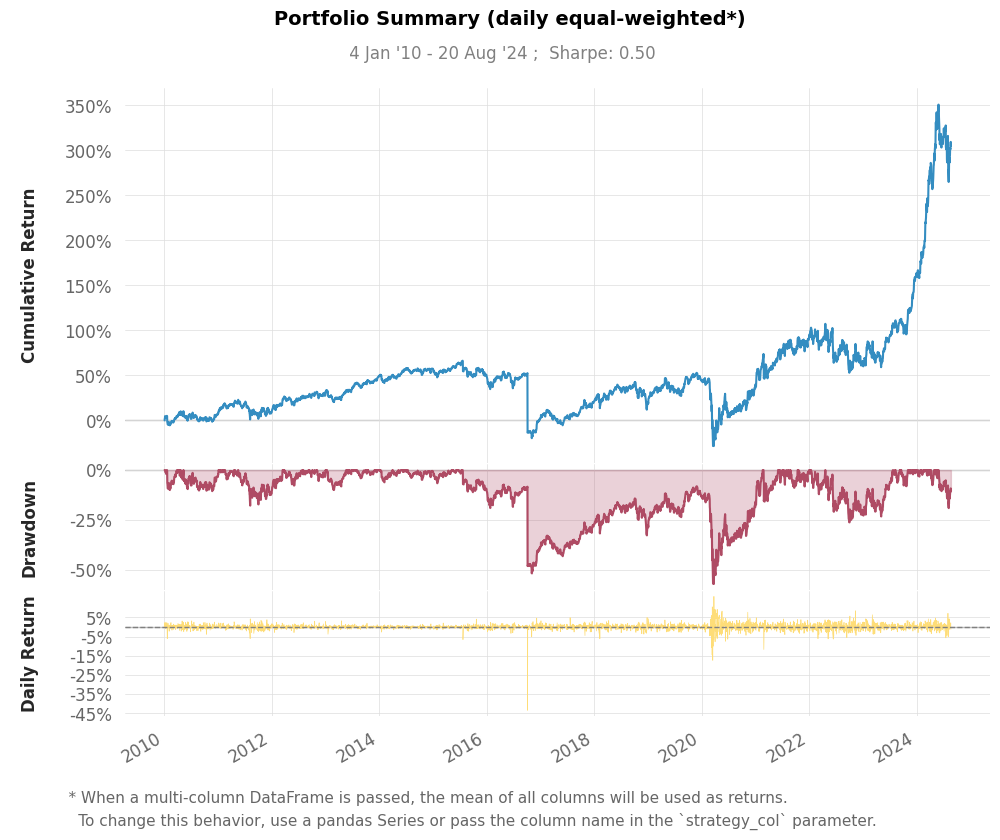


Plotting returns for the pair: DFS and WELL

Showing comparison between DFS and WELL returns.



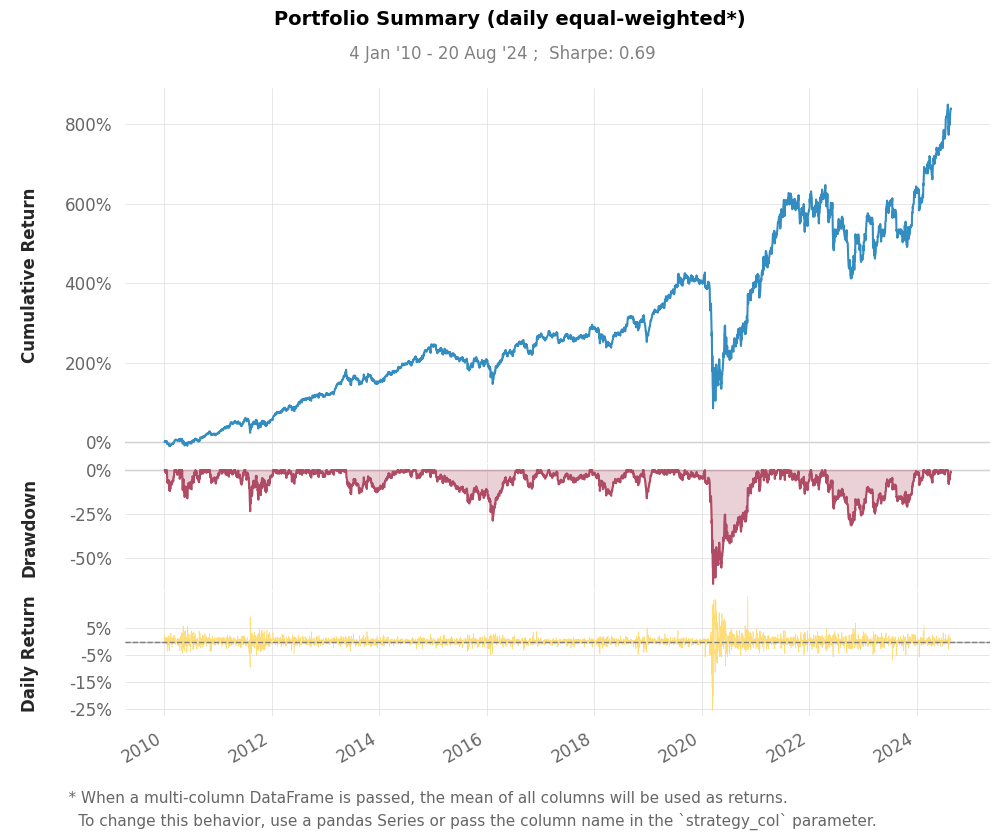


Plotting returns for the pair: ETSY and GPC

Showing comparison between ETSY and GPC returns.



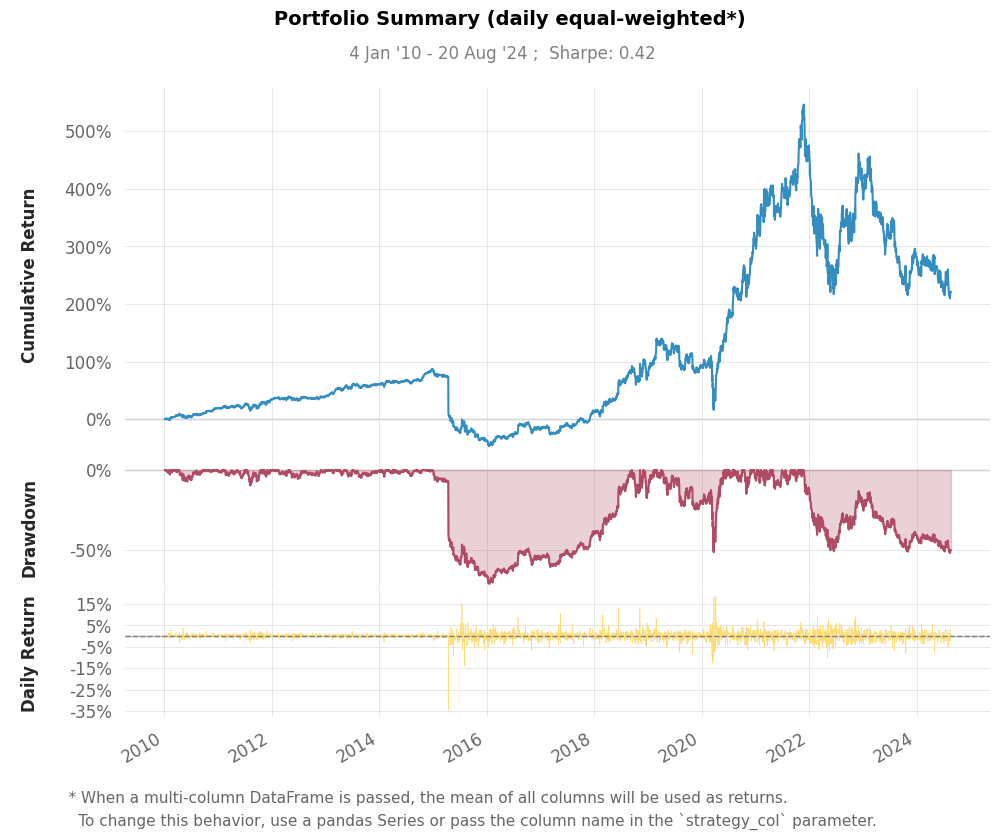


Plotting returns for the pair: ALB and POOL

Showing comparison between ALB and POOL returns.



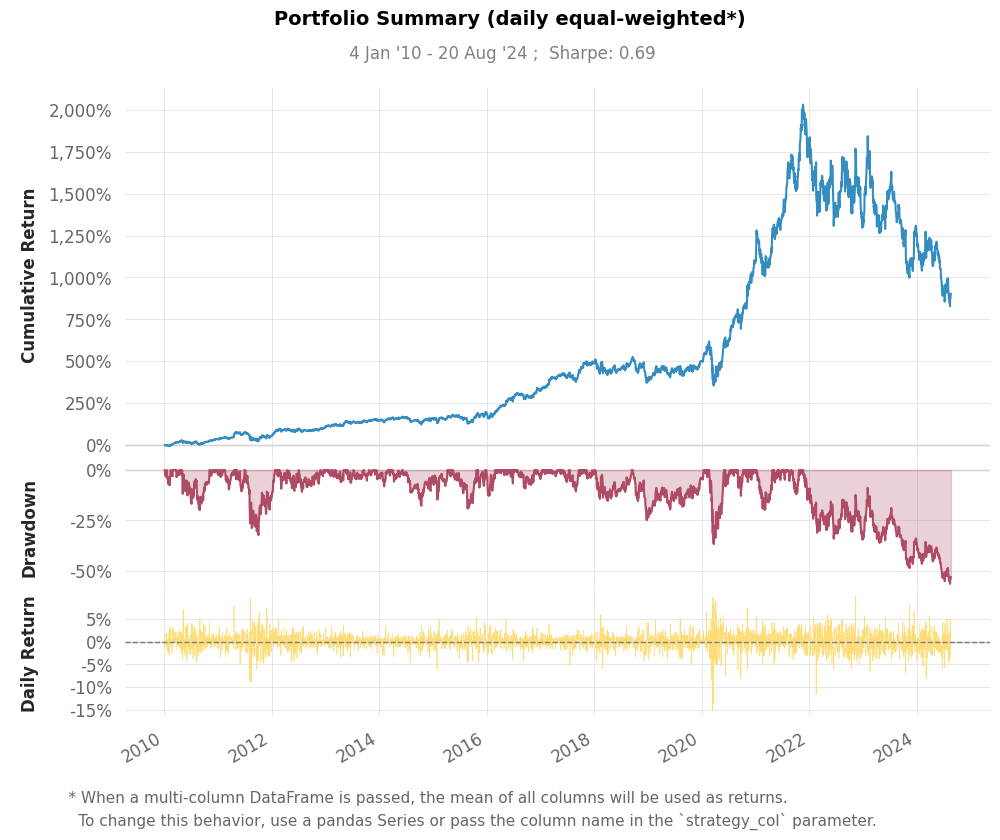


Plotting returns for the pair: HUBB and HUM

Showing comparison between HUBB and HUM returns.



In [ ]:
for ticker1, ticker2 in pairs:
    print(f'\nPlotting returns for the pair: {ticker1} and {ticker2}\n')
    # Filter for the selected tickers
    X = df.loc[df['Symbol'] == ticker1, 'Adj Close']
    Y = df.loc[df['Symbol'] == ticker2, 'Adj Close']

    # Ensure they have the same index
    X, Y = X.align(Y, join='inner')

    # Ensure the index is a DatetimeIndex
    X.index = pd.to_datetime(X.index)
    Y.index = pd.to_datetime(Y.index)

    # Calculate the returns for X and Y
    X_returns = X.vbt.to_returns()
    Y_returns = Y.vbt.to_returns()

    # Concatenate returns for visualization
    returns_df = pd.concat([X_returns, Y_returns], axis=1)
    returns_df.columns = [ticker1, ticker2]
    print(f'Showing comparison between {ticker1} and {ticker2} returns.\n')
    # Plot the returns snapshot for both tickers
    returns_df.vbt.returns.qs.plot_snapshot()

In [ ]:
!pip install dill
import dill

   # Assuming `model` is the object you want to save
with open('Pairs Trading.pkl', 'wb') as file:
       dill.dump(pf, file)